<a href="https://colab.research.google.com/github/gkdivya/EVA/blob/main/8_AdvancedTrainingConcepts/experiments/Cifar10_with_resnet34_BN_LR/Cifar10_with_resnet34_BN_LR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import libraries

In [1]:
!pip install git+https://github.com/albumentations-team/albumentations.git
!pip install torchsummary

  Cloning https://github.com/albumentations-team/albumentations.git to /tmp/pip-req-build-nnpsdtw2
  Running command git clone -q https://github.com/albumentations-team/albumentations.git /tmp/pip-req-build-nnpsdtw2
  Created wheel for albumentations: filename=albumentations-1.0.0-cp37-none-any.whl size=98531 sha256=db63424f8a1ede1fb113099134d07dddcc5ad969132c6b15e57454cbdc12e8b7
  Stored in directory: /tmp/pip-ephem-wheel-cache-72gi4abg/wheels/e2/85/3e/2a40fac5cc1f43ced656603bb2fca1327b30ec7de1b1b66517
Successfully built albumentations
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [2]:
!git clone https://github.com/gkdivya/torch_cv_wrapper.git

Cloning into 'torch_cv_wrapper'...
remote: Enumerating objects: 234, done.
remote: Counting objects: 100% (234/234), done.
remote: Compressing objects: 100% (224/224), done.
remote: Total 234 (delta 133), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (234/234), 55.89 KiB | 1.64 MiB/s, done.
Resolving deltas: 100% (133/133), done.


In [4]:
!git clone https://github.com/gkdivya/eva.git

Cloning into 'eva'...
remote: Enumerating objects: 2183, done.
remote: Counting objects: 100% (1006/1006), done.
remote: Compressing objects: 100% (648/648), done.
remote: Total 2183 (delta 758), reused 336 (delta 336), pack-reused 1177
Receiving objects: 100% (2183/2183), 16.10 MiB | 12.90 MiB/s, done.
Resolving deltas: 100% (1243/1243), done.


In [5]:
from __future__ import print_function
import torchvision
import torch
from pprint import pprint
# Let's visualize some of the images
%matplotlib inline
import matplotlib.pyplot as plt

## Import Custom Libraries
from torch_cv_wrapper.utils import plot_metrics,train,test,helper
from torch_cv_wrapper.utils.gradcam import generate_gradcam, plot_gradcam
from torch_cv_wrapper.model import resnet
from torch_cv_wrapper.main import TriggerEngine

## Load config file

In [6]:
config = helper.process_config("/content/eva/8_AdvancedTrainingConcepts/experiments/Cifar10_with_resnet34_BN_LR/Cifar10_with_resnet34_BN_LR.yaml")
use_cuda = torch.cuda.is_available()
helper.set_seed(config['model_params']['seed'],use_cuda)
device = torch.device("cuda" if use_cuda else "cpu")
pprint(config)

 loading Configuration of your experiment ..
{'criterion': 'CrossEntropyLoss',
 'data_augmentation': {'type': 'CIFAR10Albumentation'},
 'data_loader': {'args': {'batch_size': 256,
                          'num_workers': 2,
                          'pin_memory': True},
                 'classes': ['plane',
                             'car',
                             'bird',
                             'cat',
                             'deer',
                             'dog',
                             'frog',
                             'horse',
                             'ship',
                             'truck'],
                 'type': 'Cifar10DataLoader'},
 'lr_scheduler': 'LRScheduler',
 'model': 'Resnet34',
 'model_params': {'dropout': 0.05,
                  'experiment_name': 'cifar10_with_resnet34_BN',
                  'model_dir': './model/',
                  'seed': 1},
 'optimizer': {'args': {'lr': 0.001}, 'type': 'optim.Adam'},
 'training_params': {'e

## Create Training Instance

In [7]:
exp_metrics={}
experiment_name=config['model_params']['experiment_name']
trigger_training=TriggerEngine(config)

## Download data and view sample images

In [8]:
classes= config['data_loader']['classes']

#Get dataloaders
train_loader,test_loader = trigger_training.dataloader()


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


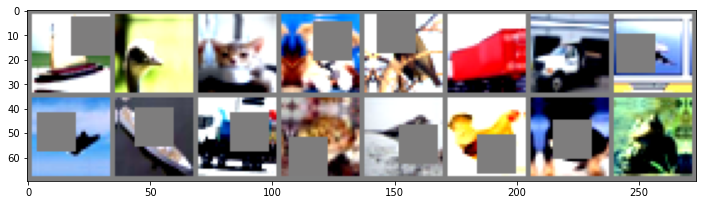

In [9]:
# get some random training images
images, labels = iter(train_loader).next()

# # show images
helper.imshow(torchvision.utils.make_grid(images[:16]))

## Model Summary

In [10]:
model = resnet.ResNet34("BN")
model.to(device)
trigger_training.model_summary(model,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
       BatchNorm2d-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
      BatchNorm2d-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13           [-1, 64, 32, 32]          36,864
      BatchNorm2d-14           [-1, 64,

## Trigger training

In [11]:
# trigger_training.
(exp_metrics[experiment_name]) = trigger_training.run_experiment(model,train_loader,test_loader)
#trigger_training.save_experiment(model,experiment_name,"/content/drive/MyDrive/Cifar10_Resnet/saved_models")

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch 1:


Loss=1.5769908428192139 Batch_id=195 LR=0.00100 Accuracy=34.08: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0066, Accuracy: 4133/10000 (41.33%)

Epoch 2:


Loss=1.4138680696487427 Batch_id=195 LR=0.00100 Accuracy=47.05: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0060, Accuracy: 4689/10000 (46.89%)

Epoch 3:


Loss=1.3932135105133057 Batch_id=195 LR=0.00100 Accuracy=55.32: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0048, Accuracy: 5860/10000 (58.60%)

Epoch 4:


Loss=1.285480260848999 Batch_id=195 LR=0.00100 Accuracy=61.42: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0039, Accuracy: 6540/10000 (65.40%)

Epoch 5:


Loss=0.9627715945243835 Batch_id=195 LR=0.00100 Accuracy=64.86: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0039, Accuracy: 6755/10000 (67.55%)

Epoch 6:


Loss=0.9612285494804382 Batch_id=195 LR=0.00100 Accuracy=67.98: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0034, Accuracy: 7099/10000 (70.99%)

Epoch 7:


Loss=0.8207660913467407 Batch_id=195 LR=0.00100 Accuracy=70.79: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0034, Accuracy: 7040/10000 (70.40%)

Epoch 8:


Loss=0.9974640011787415 Batch_id=195 LR=0.00100 Accuracy=72.47: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0027, Accuracy: 7658/10000 (76.58%)

Epoch 9:


Loss=0.5785979628562927 Batch_id=195 LR=0.00100 Accuracy=74.71: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0036, Accuracy: 7000/10000 (70.00%)

Epoch 10:


Loss=0.7425867915153503 Batch_id=195 LR=0.00100 Accuracy=76.32: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 7987/10000 (79.87%)

Epoch 11:


Loss=0.5384446382522583 Batch_id=195 LR=0.00100 Accuracy=77.63: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 7868/10000 (78.68%)

Epoch 12:


Loss=0.5632311701774597 Batch_id=195 LR=0.00100 Accuracy=78.88: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 7886/10000 (78.86%)

Epoch 13:


Loss=0.6113565564155579 Batch_id=195 LR=0.00100 Accuracy=79.82: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 7487/10000 (74.87%)

Epoch 14:


Loss=0.5409607887268066 Batch_id=195 LR=0.00100 Accuracy=80.67: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 8056/10000 (80.56%)

Epoch 15:


Loss=0.6335652470588684 Batch_id=195 LR=0.00100 Accuracy=81.65: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0020, Accuracy: 8402/10000 (84.02%)

Epoch 16:


Loss=0.46631819009780884 Batch_id=195 LR=0.00100 Accuracy=82.33: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0020, Accuracy: 8366/10000 (83.66%)

Epoch 17:


Loss=0.5561995506286621 Batch_id=195 LR=0.00100 Accuracy=83.08: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 8090/10000 (80.90%)

Epoch 18:


Loss=0.5842347741127014 Batch_id=195 LR=0.00100 Accuracy=83.78: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 8018/10000 (80.18%)

Epoch 19:


Loss=0.37151798605918884 Batch_id=195 LR=0.00100 Accuracy=84.11: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0017, Accuracy: 8588/10000 (85.88%)

Epoch 20:


Loss=0.3314666450023651 Batch_id=195 LR=0.00100 Accuracy=84.69: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 8075/10000 (80.75%)

Epoch 21:


Loss=0.4001447558403015 Batch_id=195 LR=0.00100 Accuracy=85.16: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0018, Accuracy: 8525/10000 (85.25%)

Epoch 22:


Loss=0.4540213942527771 Batch_id=195 LR=0.00100 Accuracy=85.62: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0015, Accuracy: 8748/10000 (87.48%)

Epoch 23:


Loss=0.4028069078922272 Batch_id=195 LR=0.00100 Accuracy=85.98: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0016, Accuracy: 8698/10000 (86.98%)

Epoch 24:


Loss=0.2060977667570114 Batch_id=195 LR=0.00100 Accuracy=86.42: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0017, Accuracy: 8683/10000 (86.83%)

Epoch 25:


Loss=0.32022625207901 Batch_id=195 LR=0.00100 Accuracy=86.87: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 8436/10000 (84.36%)

Epoch 26:


Loss=0.48629260063171387 Batch_id=195 LR=0.00100 Accuracy=87.28: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0017, Accuracy: 8675/10000 (86.75%)

Epoch    26: reducing learning rate of group 0 to 2.0000e-04.
Epoch 27:


Loss=0.2552835941314697 Batch_id=195 LR=0.00020 Accuracy=90.67: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9132/10000 (91.32%)

Epoch 28:


Loss=0.10887813568115234 Batch_id=195 LR=0.00020 Accuracy=91.71: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9167/10000 (91.67%)

Epoch 29:


Loss=0.2395361363887787 Batch_id=195 LR=0.00020 Accuracy=92.28: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9169/10000 (91.69%)

Epoch 30:


Loss=0.25790196657180786 Batch_id=195 LR=0.00020 Accuracy=92.38: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9181/10000 (91.81%)

Epoch 31:


Loss=0.17007392644882202 Batch_id=195 LR=0.00020 Accuracy=92.86: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9188/10000 (91.88%)

Epoch 32:


Loss=0.3305489420890808 Batch_id=195 LR=0.00020 Accuracy=92.84: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9183/10000 (91.83%)

Epoch 33:


Loss=0.1940874308347702 Batch_id=195 LR=0.00020 Accuracy=93.09: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9190/10000 (91.90%)

Epoch 34:


Loss=0.25581473112106323 Batch_id=195 LR=0.00020 Accuracy=93.42: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9145/10000 (91.45%)

Epoch 35:


Loss=0.17775222659111023 Batch_id=195 LR=0.00020 Accuracy=93.40: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9194/10000 (91.94%)

Epoch 36:


Loss=0.21588926017284393 Batch_id=195 LR=0.00020 Accuracy=93.61: 100%|██████████| 196/196 [01:48<00:00,  1.81it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9200/10000 (92.00%)

Epoch 37:


Loss=0.23930063843727112 Batch_id=195 LR=0.00020 Accuracy=93.61: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9178/10000 (91.78%)

Epoch 38:


Loss=0.3073417544364929 Batch_id=195 LR=0.00020 Accuracy=93.86: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9174/10000 (91.74%)

Epoch 39:


Loss=0.17430156469345093 Batch_id=195 LR=0.00020 Accuracy=93.96: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9178/10000 (91.78%)

Epoch 40:


Loss=0.21084542572498322 Batch_id=195 LR=0.00020 Accuracy=94.09: 100%|██████████| 196/196 [01:48<00:00,  1.80it/s]



Test set: Average loss: 0.0011, Accuracy: 9210/10000 (92.10%)



## Missclassification

Total wrong predictions are 790
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


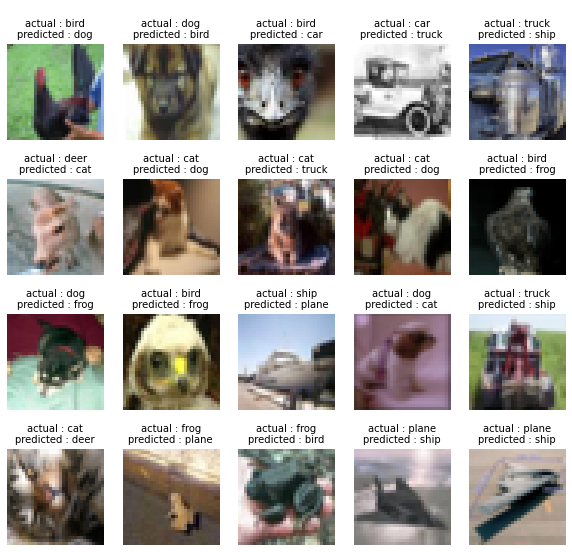

In [12]:
misclassified_images = trigger_training.wrong_predictions(model,test_loader)

## Plots for Validation Loss and Accuracy

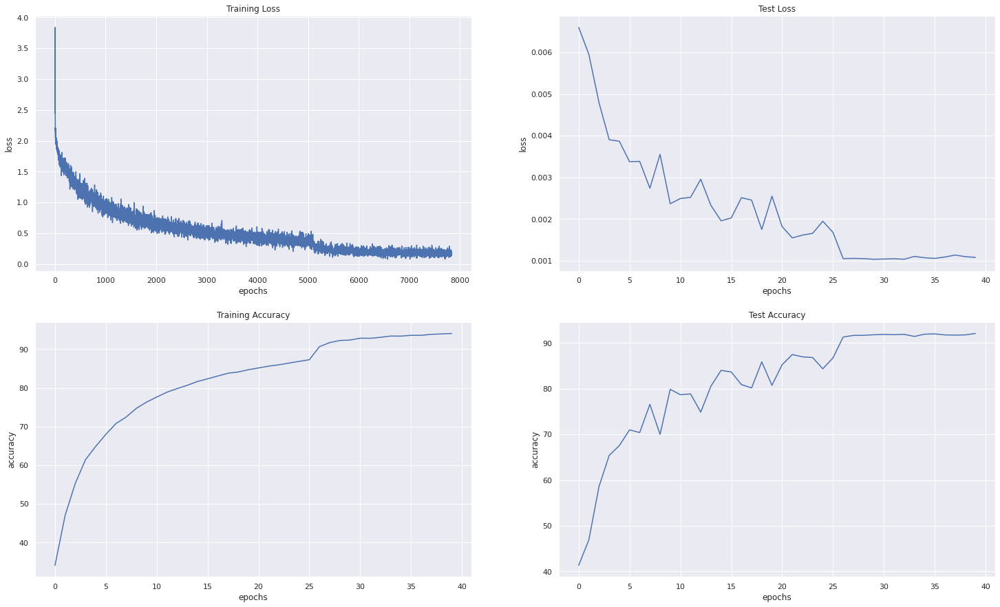

In [13]:
plot_metrics.plot_metrics(exp_metrics[experiment_name])

## Accuracy for each class

In [14]:
helper.class_level_accuracy(model, test_loader, device, classes)

Accuracy of plane : 92 %
Accuracy of   car : 96 %
Accuracy of  bird : 88 %
Accuracy of   cat : 81 %
Accuracy of  deer : 94 %
Accuracy of   dog : 86 %
Accuracy of  frog : 96 %
Accuracy of horse : 95 %
Accuracy of  ship : 97 %
Accuracy of truck : 94 %


## Plot Confusion Matrix

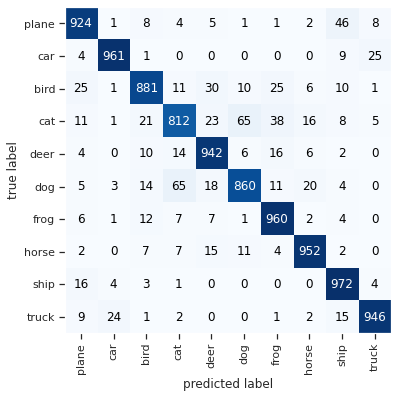

In [15]:
mat = helper.compute_confusion_matrix(model,test_loader,device)
plot_metrics.plot_confusion_matrix(mat, class_names=classes)


## Generate & Plot GradCam Images

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


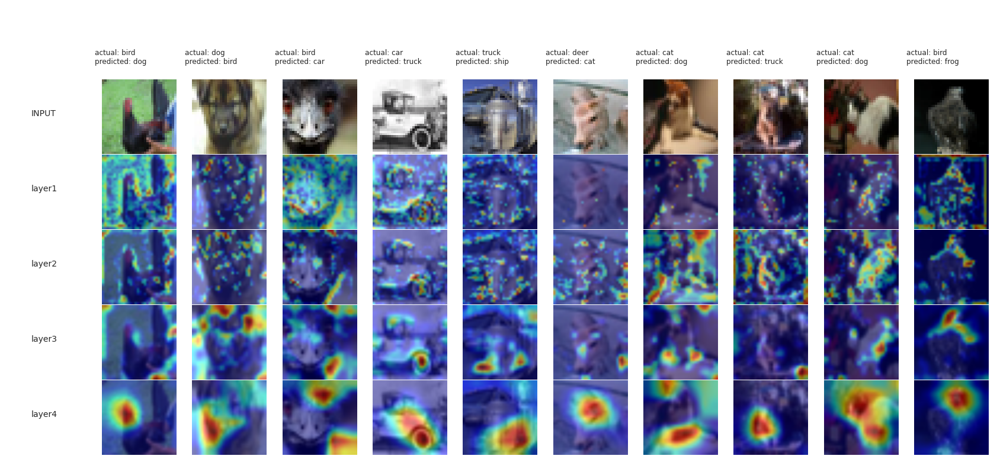

In [16]:
target_layers = ["layer1","layer2","layer3","layer4"]
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[:10], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[:10])

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


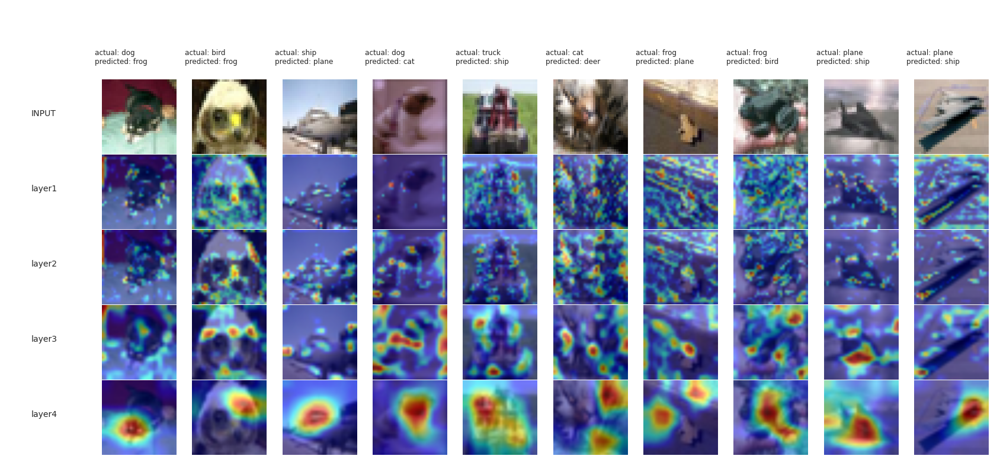

In [17]:
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[10:20], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[10:20])

In [18]:

%load_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>